# ESTUDIO DEL COVID-19
Source : https://ourworldindata.org/covid-cases  
El presente trabajo fué realizado para el diplomado de IA de la PUCP.  


## Total de muertos por millón de habitantes en el mundo

In [1]:
!wget https://covid-19.nyc3.digitaloceanspaces.com/public/owid-covid-data.csv

--2024-11-06 00:08:14--  https://covid-19.nyc3.digitaloceanspaces.com/public/owid-covid-data.csv
Resolving covid-19.nyc3.digitaloceanspaces.com (covid-19.nyc3.digitaloceanspaces.com)... 162.243.189.2
Connecting to covid-19.nyc3.digitaloceanspaces.com (covid-19.nyc3.digitaloceanspaces.com)|162.243.189.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102889431 (98M) [binary/octet-stream]
Saving to: ‘owid-covid-data.csv.2’

owid-covid-data.csv 100%[===================>]  98.12M   135MB/s    in 0.7s    

2024-11-06 00:08:15 (135 MB/s) - ‘owid-covid-data.csv.2’ saved [102889431/102889431]



In [2]:
import pandas as pd

# Cargar los datos
file_path = 'owid-covid-data.csv'
data = pd.read_csv(file_path, low_memory=False)

# Convertir la columna de fecha a tipo datetime
data['date'] = pd.to_datetime(data['date'])

# Obtener los datos de la última fecha registrada para cada país
latest_data = data.loc[data.groupby('location')['date'].idxmax()]

# Seleccionar las columnas relevantes: país/región, iso_code y muertes totales por millón
total_deaths_per_million = latest_data[['location', 'iso_code', 'total_deaths_per_million']]

# Eliminar filas con datos faltantes en total_deaths_per_million
total_deaths_per_million = total_deaths_per_million.dropna()

total_deaths_per_million

,location,iso_code,total_deaths_per_million
1673,Afghanistan,AFG,197.098
3347,Africa,OWID_AFR,179.157
5021,Albania,ALB,1274.926
6695,Algeria,DZA,151.306
8369,American Samoa,ASM,702.988
...,...,...,...
419855,Vietnam,VNM,433.444
422727,Wallis and Futuna,WLF,782.541
426086,Yemen,YEM,56.484
427760,Zambia,ZMB,202.303


In [3]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Choropleth(
    locations = total_deaths_per_million['iso_code'],
    z = total_deaths_per_million['total_deaths_per_million'],
    text = total_deaths_per_million['location'],
    colorscale = 'Reds',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_tickprefix = '',
    colorbar_title = 'Muertos por Millón de Habitantes',
))

fig.update_layout(
    title_text='TOTAL DE MUERTES POR MILLÓN DE HABITANTES AL NIVEL MUNDIAL',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    annotations = [dict(
        x=0.55,
        y=0.1,
        xref='paper',
        yref='paper',
        text='Source: <a href="https://ourworldindata.org/covid-cases"> Coronavirus (COVID-19) Cases</a>',
        showarrow = False
    )]
)

fig.show()

Se observa que la India no tiene datos, por lo que lo analizamos.

In [4]:

# Filtrar solo los datos para India
india_data = data[data['location'] == 'India'][['date', 'total_deaths', 'total_deaths_per_million']]

# Mostrar las últimas filas para observar si hay datos parciales
print("Datos de muertes totales y muertes por millón para India:")
print(india_data.tail())

# También puedes verificar cuántas filas tienen datos en 'total_deaths_per_million'
missing_data = india_data['total_deaths_per_million'].isna().sum()
print(f"\nNúmero de filas sin datos en 'total_deaths_per_million': {missing_data}")


Datos de muertes totales y muertes por millón para India:
             date  total_deaths  total_deaths_per_million
175226 2024-08-08           NaN                       NaN
175227 2024-08-09           NaN                       NaN
175228 2024-08-10           NaN                       NaN
175229 2024-08-11           NaN                       NaN
175230 2024-08-12           NaN                       NaN

Número de filas sin datos en 'total_deaths_per_million': 8


Se observa que no hay datos para las últimas filas. Asi que mejor haremos el analisis hasta 2024-12-31. El motivo de tal decisión es por un tema facilidad.

In [5]:
# Filtrar los datos hasta diciembre de 2023
data = data[data['date'] <= '2023-12-31']

# Obtener los datos de la última fecha registrada hasta 2023 para cada país
latest_data = data.loc[data.groupby('location')['date'].idxmax()]

# Seleccionar las columnas relevantes: país/región, iso_code y muertes totales por millón
total_deaths_per_million = latest_data[['location', 'iso_code', 'total_deaths_per_million']]

# Eliminar filas con datos faltantes en total_deaths_per_million
total_deaths_per_million = total_deaths_per_million.dropna()


import plotly.graph_objects as go

fig = go.Figure(data=go.Choropleth(
    locations = total_deaths_per_million['iso_code'],
    z = total_deaths_per_million['total_deaths_per_million'],
    text = total_deaths_per_million['location'],
    colorscale = 'Reds',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_tickprefix = '',
    colorbar_title = 'Muertos por Millón de Habitantes',
))

fig.update_layout(
    title_text='TOTAL DE MUERTES POR MILLÓN DE HABITANTES AL NIVEL MUNDIAL HASTA EL 2023-12-31',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    annotations = [dict(
        x=0.55,
        y=0.1,
        xref='paper',
        yref='paper',
        text='Source: <a href="https://ourworldindata.org/covid-cases"> Coronavirus (COVID-19) Cases</a>',
        showarrow = False
    )]
)

fig.show()

Vemos que ahora si contamos con la data de la India. Peor ahora analizemos para todos.

In [6]:
import pandas as pd

# Cargar los datos
file_path = 'owid-covid-data.csv'
data = pd.read_csv(file_path)

# Convertir la columna de fecha a tipo datetime
data['date'] = pd.to_datetime(data['date'])

# Obtener la última fecha registrada para cada país
last_record_dates = data.groupby('location')['date'].max().reset_index()

# Renombrar la columna para mayor claridad
last_record_dates.columns = ['location', 'last_record_date']

# Mostrar los resultados
print("Última fecha de registro por país:")
print(last_record_dates)

# Opcional: Filtrar países que dejaron de reportar antes de diciembre de 2023
countries_stopped_reporting = last_record_dates[last_record_dates['last_record_date'] < '2023-12-31']

print("\nPaíses que dejaron de reportar antes de diciembre de 2023:")
print(countries_stopped_reporting)


Última fecha de registro por país:
           location last_record_date
0       Afghanistan       2024-08-04
1            Africa       2024-08-04
2           Albania       2024-08-04
3           Algeria       2024-08-04
4    American Samoa       2024-08-04
..              ...              ...
250  Western Sahara       2022-04-20
251           World       2024-08-14
252           Yemen       2024-08-04
253          Zambia       2024-08-04
254        Zimbabwe       2024-08-04

[255 rows x 2 columns]

Países que dejaron de reportar antes de diciembre de 2023:
             location last_record_date
65            England       2023-12-08
131             Macao       2023-04-13
166   Northern Cyprus       2022-12-06
167  Northern Ireland       2023-12-11
200          Scotland       2023-10-02
222            Taiwan       2023-09-24
248             Wales       2023-07-12
250    Western Sahara       2022-04-20


Vemos los valores máximos de registros de los demás países.
Ahora todo lo que grafiquemos será hasta la fecha escogida (2024-12-31)
## Evolución de la totalidad de muertes por millón de habitantes al nivel mundial

In [7]:
import pandas as pd
import plotly.graph_objects as go

# Cargar los datos
file_path = 'owid-covid-data.csv'
data = pd.read_csv(file_path)

# Convertir la columna de fecha a tipo datetime
data['date'] = pd.to_datetime(data['date'])

# Filtrar los datos hasta diciembre de 2023
data = data[data['date'] <= '2023-12-31']

# Eliminar filas con datos faltantes en total_deaths_per_million
data = data.dropna(subset=['total_deaths_per_million'])

# Crear los frames para la animación
frames = []
for date, frame_data in data.groupby('date'):
    frames.append(go.Frame(
        data=go.Choropleth(
            locations=frame_data['iso_code'],
            z=frame_data['total_deaths_per_million'],
            text=frame_data['location'],
            colorscale='Reds',
            autocolorscale=False,
            reversescale=False,
            marker_line_color='darkgray',
            marker_line_width=0.5,
            colorbar_tickprefix='',
            colorbar_title='Muertos por Millón de Habitantes',
        ),
        name=str(date.date())
    ))

# Crear la figura inicial
fig = go.Figure(
    data=go.Choropleth(
        locations=data[data['date'] == data['date'].min()]['iso_code'],
        z=data[data['date'] == data['date'].min()]['total_deaths_per_million'],
        text=data[data['date'] == data['date'].min()]['location'],
        colorscale='Reds',
        autocolorscale=False,
        reversescale=False,
        marker_line_color='darkgray',
        marker_line_width=0.5,
        colorbar_tickprefix='',
        colorbar_title='Muertos por Millón de Habitantes',
    ),
    frames=frames
)

# Configuración del layout
fig.update_layout(
    title_text='Evolución de Muertes por Millón de Habitantes a Nivel Mundial',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    updatemenus=[dict(
        type='buttons',
        showactive=False,
        buttons=[dict(label='Play',
                      method='animate',
                      args=[None, {'frame': {'duration': 0.01, 'redraw': True}, 'fromcurrent': True}]),
                 dict(label='Pause',
                      method='animate',
                      args=[[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                                     'transition': {'duration': 0}}])]
    )]
)

# Agregar el slider
fig.update_layout(
    sliders=[dict(
        steps=[dict(method='animate',
                    args=[[str(date.date())],
                          dict(mode='immediate',
                               frame={'duration': 0.01, 'redraw': True},
                               transition={'duration': 0})],
                    label=str(date.date()))
               for date in data['date'].sort_values().unique()],
        transition={'duration': 0},
        x=0.1,
        xanchor='left',
        y=0,
        yanchor='top'
    )]
)

fig.show()


## Graficando el total de casos por millón de habitantes a nivel mundial

In [8]:
import pandas as pd

# Cargar los datos
file_path = 'owid-covid-data.csv'
data = pd.read_csv(file_path)

# Convertir la columna de fecha a tipo datetime
data['date'] = pd.to_datetime(data['date'])

# Filtrar los datos hasta diciembre de 2023
data = data[data['date'] <= '2023-12-31']

# Obtener los datos de la última fecha registrada hasta 2023 para cada país
latest_data = data.loc[data.groupby('location')['date'].idxmax()]

# Seleccionar las columnas relevantes: país/región, iso_code y casos totales por millón
total_cases_per_million = latest_data[['location', 'iso_code', 'total_cases_per_million']]

# Eliminar filas con datos faltantes en total_cases_per_million
total_cases_per_million = total_cases_per_million.dropna()

import plotly.graph_objects as go


fig = go.Figure(data=go.Choropleth(
    locations = total_cases_per_million['iso_code'],
    z = total_cases_per_million['total_cases_per_million'],
    text = total_cases_per_million['location'],
    colorscale = 'Blues',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_tickprefix = '',
    colorbar_title = 'Total de Casos por Millón de Habitantes',
))

fig.update_layout(
    title_text='TOTAL DE CASOS POR MILLÓN DE HABITANTES AL NIVEL MUNDIAL',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    annotations = [dict(
        x=0.55,
        y=0.1,
        xref='paper',
        yref='paper',
        text='Source: <a href="https://ourworldindata.org/covid-cases"> Coronavirus (COVID-19) Cases</a>',
        showarrow = False
    )]
)

fig.show()


## Evolución de los muertos por millón de habitantes en Perú

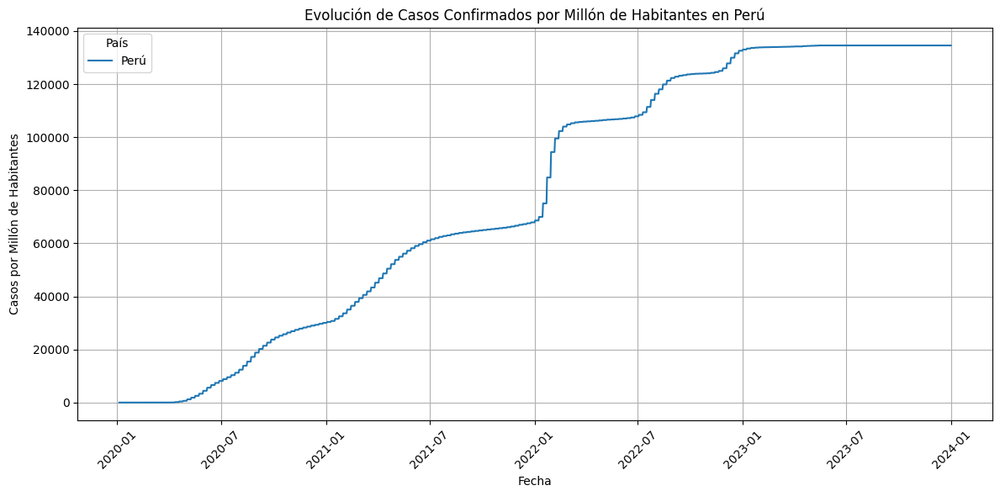

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar los datos
file_path = 'owid-covid-data.csv'  # Asegúrate de colocar aquí la ruta correcta de tu archivo
data = pd.read_csv(file_path)

# Convertir la columna de fecha a tipo datetime
data['date'] = pd.to_datetime(data['date'])

# Filtrar los datos hasta diciembre de 2023 y para Perú
data = data[(data['date'] <= '2023-12-31') & (data['location'] == 'Peru')]

# Filtrar para eliminar filas con datos faltantes en total_cases_per_million
data = data.dropna(subset=['total_cases_per_million'])

# Crear la gráfica para Perú
plt.figure(figsize=(12, 6))
plt.plot(data['date'], data['total_cases_per_million'], label='Perú')

# Configurar el diseño de la gráfica
plt.title('Evolución de Casos Confirmados por Millón de Habitantes en Perú')
plt.xlabel('Fecha')
plt.ylabel('Casos por Millón de Habitantes')
plt.legend(title='País')
plt.xticks(rotation=45)
plt.grid(True)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


## Apendice A: Pruebas en código

In [10]:
df = pd.read_csv("owid-covid-data.csv", low_memory=False)

In [11]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN


In [12]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429435 entries, 0 to 429434
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    429435 non-null  object 
 1   continent                                   402910 non-null  object 
 2   location                                    429435 non-null  object 
 3   date                                        429435 non-null  object 
 4   total_cases                                 411804 non-null  float64
 5   new_cases                                   410159 non-null  float64
 6   new_cases_smoothed                          408929 non-null  float64
 7   total_deaths                                411804 non-null  float64
 8   new_deaths                                  410608 non-null  float64
 9   new_deaths_smoothed                         409378 non-null  float64
 